In [3]:
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

sc.set_figure_params(dpi=100, frameon=False, color_map='Reds', facecolor=None)
sc.logging.print_header()

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.4 scipy==1.9.1 pandas==1.4.4 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.10.2 pynndescent==0.5.7


/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


In [4]:
import os
os.chdir('..')

In [5]:
adata = sc.read("./datasets/hlca.h5ad")

Manually curated cell type markers from Lisa.

In [6]:
from scripts import hlca_markers
orig_markers = hlca_markers()

FA-based cell type markers, according to the genes with the 5 highest attributions.

In [10]:
data_path = '.'

In [38]:
feature_importance_files = {
    'random': f'{data_path}/outputs/baselines/task2_random.csv',
    'mean': f'{data_path}/outputs/baselines/task2_mean.csv',
    'DE': f'{data_path}/outputs/differential_expression/task2_DE_cell_types.csv',
    'ablation': f'{data_path}/outputs/ablation/task2_abs.csv',
    'IG': f'{data_path}/outputs/integrated_gradients/task2_absolute_sum_integrated_grads.csv',
    'EG': f'{data_path}/outputs/expected_gradients/task2_absolute_sum_expected_grads.csv'
}

ranking_dfs = {explainer: pd.read_csv(file_name, index_col=0) for explainer, file_name in feature_importance_files.items()}
ranking_dfs['DE'] = -ranking_dfs['DE']

ct_markers = {}
for k, df in ranking_dfs.items():
    ct_markers[k] = {ct: df.sort_values(ct, ascending=False).index.values[:5] for ct in df.columns}

Because the manually curated markers don't align perfectly with the celltypes defined in `scanvi_labels`, we'll subset here to make the following plots more clear.

In [23]:
overlapping_cts = list(set(orig_markers.keys()) & set(ct_markers['DE'].keys()))
len(overlapping_cts)

21

In [21]:
adata = adata[adata.obs.scanvi_label.isin(overlapping_cts)]

In [29]:
plot_order = adata.obs.scanvi_label.cat.categories
def custom_dotplot(gene_dict):
    sc.pl.dotplot(adata, gene_dict, groupby='scanvi_label', categories_order=plot_order)

Expression of manually curated marker genes in their respective cell types.

/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_baseplot_class.py:514: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  matplotlib.colorbar.Colorbar(


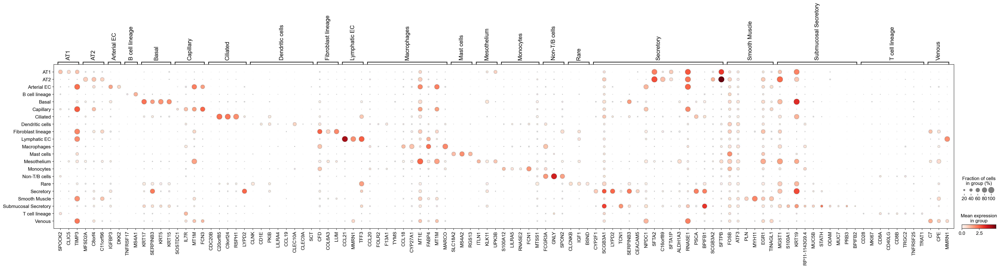

In [35]:
custom_dotplot({k:orig_markers[k] for k in plot_order})

Expression of automatic marker selection by either random, DE, or feature attribution methods.

random


/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_baseplot_class.py:514: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  matplotlib.colorbar.Colorbar(


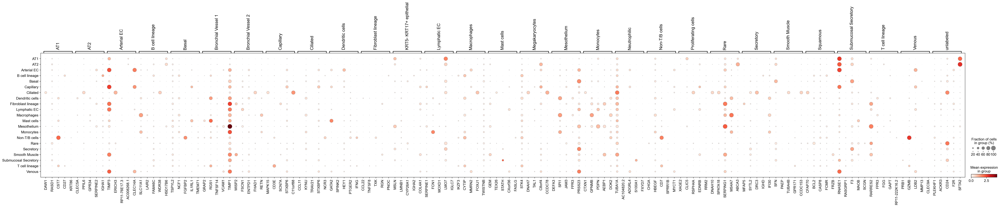

mean


/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_baseplot_class.py:514: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  matplotlib.colorbar.Colorbar(


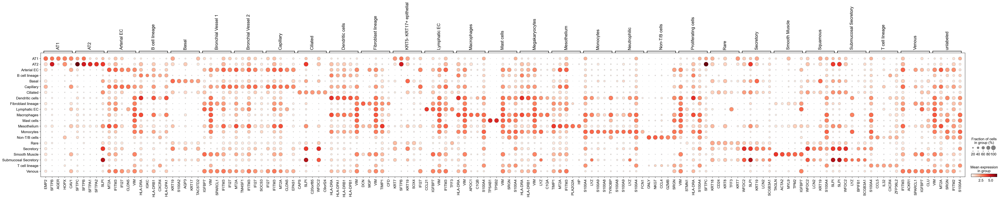

DE


/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_baseplot_class.py:514: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  matplotlib.colorbar.Colorbar(


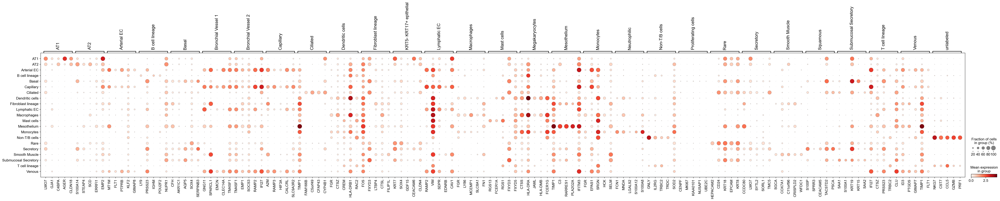

ablation


/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_baseplot_class.py:514: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  matplotlib.colorbar.Colorbar(


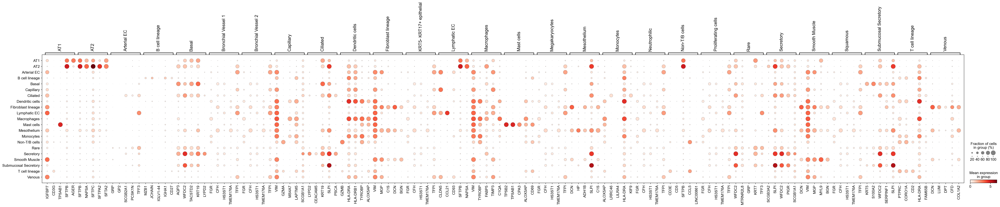

IG


/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_baseplot_class.py:514: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  matplotlib.colorbar.Colorbar(


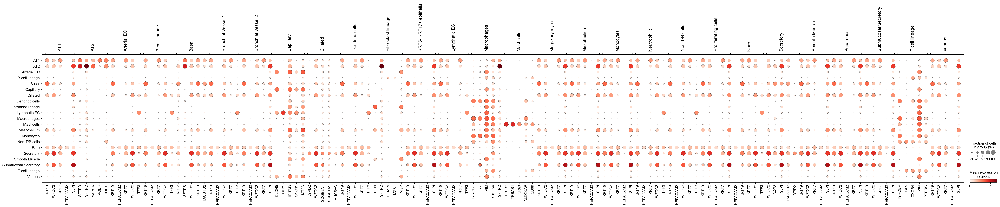

EG


/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_baseplot_class.py:514: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  matplotlib.colorbar.Colorbar(


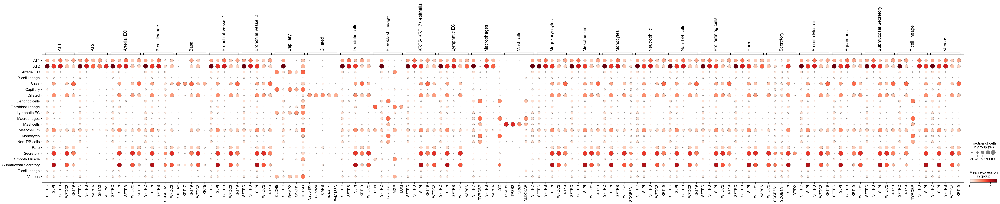

In [39]:
for k, marker_dict in ct_markers.items():
    print(k)
    custom_dotplot(marker_dict)

Single positive example.

/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_baseplot_class.py:514: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  matplotlib.colorbar.Colorbar(


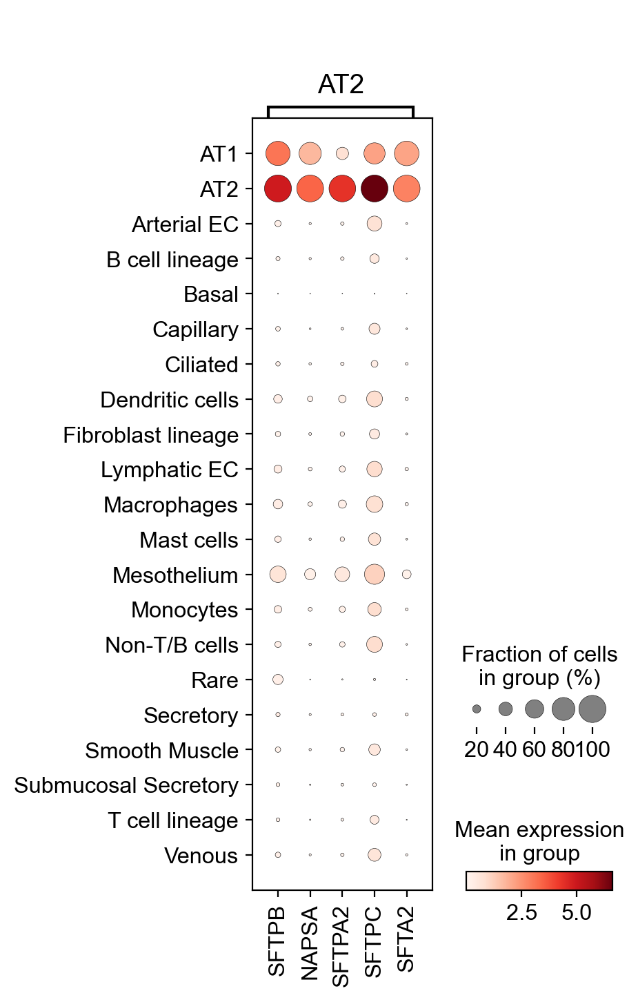

In [38]:
sc.pl.dotplot(subset, {k:ab_markers[k] for k in ['AT2']}, groupby='scanvi_label')

What, where is this from

/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/home/icb/yuge.ji/miniconda3/envs/test_env3/lib/python3.10/site-packages/scanpy/plotting/_baseplot_class.py:514: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  matplotlib.colorbar.Colorbar(


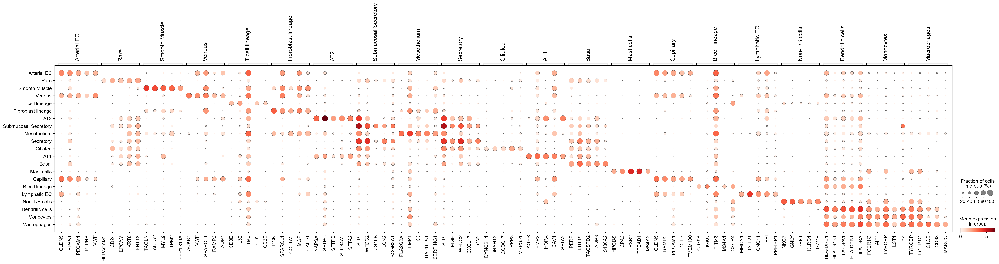

In [27]:
sc.pl.dotplot(subset, {k:de_markers[k] for k in overlapping_cts}, groupby='scanvi_label', categories_order=overlapping_cts)